# SyriaTel Customer Churn
### by Justin Weible

## Business Problem

This project attempts to create a model in order to help SyriaTel predict whether a customer will churn.

In addition to predicting customer churn, this model will also try and identify the reasons why a customer might decide to churn so that SyriaTel can determine how they can make their service better.

## Imports

In [133]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import pyplot
%matplotlib inline
import numpy as np
import seaborn as sns
sns.set(rc={'figure.figsize':(10, 7)});

from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.compose import make_column_transformer
from sklearn.model_selection import train_test_split

#Sampling
from collections import Counter
import imblearn
from imblearn.over_sampling import RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import SMOTE

# Logistic Regression
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix
from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics import precision_score, recall_score, accuracy_score, f1_score
from sklearn.metrics import roc_curve, auc
from sklearn.datasets import make_classification
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import KFold
from sklearn.feature_selection import RFE

# KNN
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import precision_score, recall_score, accuracy_score, f1_score

# Naive Bayes
from scipy import stats

# Decision Trees
from math import log #to calculate entropy
from sklearn.tree import DecisionTreeClassifier 
from sklearn.preprocessing import OneHotEncoder
from sklearn import tree

# Regression with CART Trees
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error, mean_squared_error

# Random Forest
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import BaggingClassifier, RandomForestClassifier

# GridSearch
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.metrics import accuracy_score

# Gradient Boosting
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.ensemble import AdaBoostClassifier, GradientBoostingClassifier
from sklearn.metrics import accuracy_score, f1_score, confusion_matrix, classification_report

# XGBoost
import xgboost as xgb # xgb.XGBClassifier()

# SVM
from sklearn import svm
from sklearn.svm import SVC
import statsmodels as sm


# Pipelines
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import Pipeline


import warnings
warnings.filterwarnings('ignore')

## Data

In [134]:
df = pd.read_csv('data/churn.csv')
df.head()

,state,account length,area code,phone number,international plan,voice mail plan,number vmail messages,total day minutes,total day calls,total day charge,...,total eve calls,total eve charge,total night minutes,total night calls,total night charge,total intl minutes,total intl calls,total intl charge,customer service calls,churn
0,KS,128,415,382-4657,no,yes,25,265.1,110,45.07,...,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False
1,OH,107,415,371-7191,no,yes,26,161.6,123,27.47,...,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False
2,NJ,137,415,358-1921,no,no,0,243.4,114,41.38,...,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False
3,OH,84,408,375-9999,yes,no,0,299.4,71,50.90,...,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False
4,OK,75,415,330-6626,yes,no,0,166.7,113,28.34,...,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False


In [135]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3333 entries, 0 to 3332
Data columns (total 21 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   state                   3333 non-null   object 
 1   account length          3333 non-null   int64  
 2   area code               3333 non-null   int64  
 3   phone number            3333 non-null   object 
 4   international plan      3333 non-null   object 
 5   voice mail plan         3333 non-null   object 
 6   number vmail messages   3333 non-null   int64  
 7   total day minutes       3333 non-null   float64
 8   total day calls         3333 non-null   int64  
 9   total day charge        3333 non-null   float64
 10  total eve minutes       3333 non-null   float64
 11  total eve calls         3333 non-null   int64  
 12  total eve charge        3333 non-null   float64
 13  total night minutes     3333 non-null   float64
 14  total night calls       3333 non-null   

In [136]:
df.columns = df.columns.map(lambda col: col.replace(' ','_'))
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3333 entries, 0 to 3332
Data columns (total 21 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   state                   3333 non-null   object 
 1   account_length          3333 non-null   int64  
 2   area_code               3333 non-null   int64  
 3   phone_number            3333 non-null   object 
 4   international_plan      3333 non-null   object 
 5   voice_mail_plan         3333 non-null   object 
 6   number_vmail_messages   3333 non-null   int64  
 7   total_day_minutes       3333 non-null   float64
 8   total_day_calls         3333 non-null   int64  
 9   total_day_charge        3333 non-null   float64
 10  total_eve_minutes       3333 non-null   float64
 11  total_eve_calls         3333 non-null   int64  
 12  total_eve_charge        3333 non-null   float64
 13  total_night_minutes     3333 non-null   float64
 14  total_night_calls       3333 non-null   

## Data Transformation

For data transformation, I dropped the columns for state, area code, and phone number because I didn't think these were relevant to the model that I wanted to create.

This particular model is looking strictly at overall customer churn and not focusing on customer churn that's based on location.

In [137]:
df.drop(columns=['state', 'area_code', 'phone_number'], axis=1, inplace=True)
df.head()

,account_length,international_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,customer_service_calls,churn
0,128,no,yes,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False
1,107,no,yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False
2,137,no,no,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False
3,84,yes,no,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False
4,75,yes,no,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False


In [138]:
df['international_plan'] = df['international_plan'].map({'no': 0, 'yes': 1})
df.head()

,account_length,international_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,customer_service_calls,churn
0,128,0,yes,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False
1,107,0,yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False
2,137,0,no,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False
3,84,1,no,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False
4,75,1,no,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False


In [139]:
df['voice_mail_plan'] = df['voice_mail_plan'].map({'no': 0, 'yes': 1})
df.head()

,account_length,international_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,customer_service_calls,churn
0,128,0,1,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False
1,107,0,1,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False
2,137,0,0,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False
3,84,1,0,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False
4,75,1,0,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False


In [140]:
df['churn'] = df['churn'].map({False: 0, True: 1})
df.head()

,account_length,international_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,customer_service_calls,churn
0,128,0,1,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,0
1,107,0,1,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,0
2,137,0,0,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,0
3,84,1,0,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,0
4,75,1,0,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,0


In [141]:
df['churn'].value_counts()

0    2850
1     483
Name: churn, dtype: int64

In [142]:
df['churn'].value_counts(normalize=True)

0    0.855086
1    0.144914
Name: churn, dtype: float64

## Adding Columns For Features

I decided to add a number of new columns to the dataframe in order to create some additional data.

I added columns that totaled all charges, numbers of call, and minutes. Then I also added columns for the average charge per call, average length of call, and average charge per minute.

### Totals for Columns

In [143]:
df['total_charges'] = round(df['total_day_charge'] + df['total_eve_charge'] + df['total_night_charge'] + df['total_intl_charge'])

In [144]:
df['total_calls'] = round(df['total_day_calls'] + df['total_eve_calls'] + df['total_night_calls'] + df['total_intl_calls'])

In [145]:
df['total_minutes'] = round(df['total_day_minutes'] + df['total_eve_minutes'] + df['total_night_minutes'] + df['total_intl_minutes'])

### Average for Columns

In [146]:
# Average Charge Per Call

df['day_charge_per call'] = round(df['total_day_charge'] / (df['total_day_calls'] + 0.00000000001), 3)
    
df['eve_charge_per_call'] = round(df['total_eve_charge'] / (df['total_eve_calls'] + 0.00000000001), 3)

df['night_charge_per_call'] = round(df['total_night_charge'] / (df['total_night_calls'] + 0.00000000001), 3)

df['intl_charge_per_call'] = round(df['total_intl_charge'] / (df['total_intl_calls'] + 0.00000000001), 3)

In [147]:
# Average Call Length Per Call

df['day_call_length_per_call'] = round(df['total_day_minutes'] / (df['total_day_calls']  + 0.00000000001), 3)

df['eve_call_length_per_call'] = round(df['total_eve_minutes'] / (df['total_eve_calls']  + 0.00000000001), 3)
    
df['night_call_length_per_call'] = round(df['total_night_minutes'] / (df['total_night_calls']  + 0.00000000001), 3)

df['intl_call_length_per_call'] = round(df['total_intl_minutes'] / (df['total_intl_calls']  + 0.00000000001), 3)

In [148]:
# Average Charge Per Minute

df['day_charge_per_min'] = round(df['total_day_charge'] / (df['total_day_minutes'] + 0.00000000001), 3)
    
df['eve_charge_per_min'] = round(df['total_eve_charge'] / (df['total_eve_minutes'] + 0.00000000001), 3)
    
df['night_charge_per_min'] = round(df['total_night_charge'] / (df['total_night_minutes'] + 0.00000000001), 3)

df['intl_charge_per_min'] = round(df['total_intl_charge'] / (df['total_intl_minutes'] + 0.00000000001), 3)

In [149]:
# Average Charge Percentage

df['day_charge_percentage'] = round(df['total_day_charge'] / (df['total_charges'] + 0.00000000001), 3)
    
df['eve_charge_percentage'] = round(df['total_eve_charge'] / (df['total_charges'] + 0.00000000001), 3)
    
df['night_charge_percentage'] = round(df['total_night_charge'] / (df['total_charges'] + 0.00000000001), 3)

df['intl_charge_percentage'] = round(df['total_intl_charge'] / (df['total_charges'] + 0.00000000001), 3)

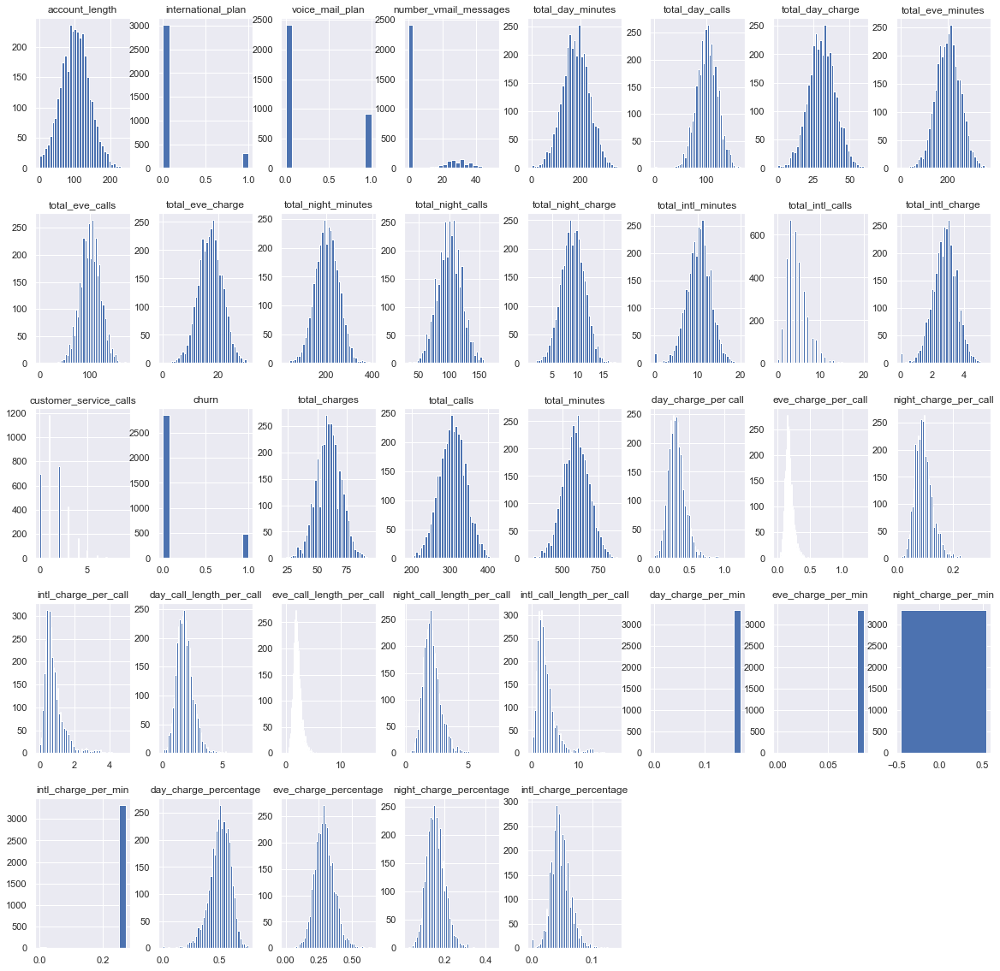

In [150]:
df.hist(bins='auto', layout=(5,8), figsize = (20,20));

I exported the dataframe with the new columns to a new CSV for ease of modeling.

In [151]:
df.to_csv('data/churn_clean.csv')

In [152]:
df = pd.read_csv('data/churn_clean.csv')
print('Dataframe Shape: ',df.shape)
df.head()

Dataframe Shape:  (3333, 38)


,Unnamed: 0,account_length,international_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,...,night_call_length_per_call,intl_call_length_per_call,day_charge_per_min,eve_charge_per_min,night_charge_per_min,intl_charge_per_min,day_charge_percentage,eve_charge_percentage,night_charge_percentage,intl_charge_percentage
0,0,128,0,1,25,265.1,110,45.07,197.4,99,...,2.689,3.333,0.17,0.085,0.045,0.27,0.593,0.221,0.145,0.036
1,1,107,0,1,26,161.6,123,27.47,195.5,103,...,2.470,4.567,0.17,0.085,0.045,0.27,0.466,0.282,0.194,0.063
2,2,137,0,0,0,243.4,114,41.38,121.2,110,...,1.563,2.440,0.17,0.085,0.045,0.27,0.667,0.166,0.118,0.053
3,3,84,1,0,0,299.4,71,50.90,61.9,88,...,2.212,0.943,0.17,0.085,0.045,0.27,0.760,0.079,0.132,0.027
4,4,75,1,0,0,166.7,113,28.34,148.3,122,...,1.545,3.367,0.17,0.085,0.045,0.27,0.545,0.242,0.162,0.052


In [153]:
df.drop('Unnamed: 0', axis=1, inplace=True)
df.head()

,account_length,international_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,...,night_call_length_per_call,intl_call_length_per_call,day_charge_per_min,eve_charge_per_min,night_charge_per_min,intl_charge_per_min,day_charge_percentage,eve_charge_percentage,night_charge_percentage,intl_charge_percentage
0,128,0,1,25,265.1,110,45.07,197.4,99,16.78,...,2.689,3.333,0.17,0.085,0.045,0.27,0.593,0.221,0.145,0.036
1,107,0,1,26,161.6,123,27.47,195.5,103,16.62,...,2.470,4.567,0.17,0.085,0.045,0.27,0.466,0.282,0.194,0.063
2,137,0,0,0,243.4,114,41.38,121.2,110,10.30,...,1.563,2.440,0.17,0.085,0.045,0.27,0.667,0.166,0.118,0.053
3,84,1,0,0,299.4,71,50.90,61.9,88,5.26,...,2.212,0.943,0.17,0.085,0.045,0.27,0.760,0.079,0.132,0.027
4,75,1,0,0,166.7,113,28.34,148.3,122,12.61,...,1.545,3.367,0.17,0.085,0.045,0.27,0.545,0.242,0.162,0.052


In [154]:
df['churn'].value_counts()

0    2850
1     483
Name: churn, dtype: int64

In [155]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3333 entries, 0 to 3332
Data columns (total 37 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   account_length              3333 non-null   int64  
 1   international_plan          3333 non-null   int64  
 2   voice_mail_plan             3333 non-null   int64  
 3   number_vmail_messages       3333 non-null   int64  
 4   total_day_minutes           3333 non-null   float64
 5   total_day_calls             3333 non-null   int64  
 6   total_day_charge            3333 non-null   float64
 7   total_eve_minutes           3333 non-null   float64
 8   total_eve_calls             3333 non-null   int64  
 9   total_eve_charge            3333 non-null   float64
 10  total_night_minutes         3333 non-null   float64
 11  total_night_calls           3333 non-null   int64  
 12  total_night_charge          3333 non-null   float64
 13  total_intl_minutes          3333 

## Model Functions

To simplify the modeling process, I wrote a number of functions to automate each individual model. 

Four of the functions were written to automate each step of the modeling process, while two functions were written that combine the three steps of prediction, confusion matrix, and ROC curve into one function.

There's also a Feature Importance function in order to plot feature importances in order to see what features have the most influence on the model to give a general idea of what might be affecting churn.

In [156]:
## Prediction Function

def model_predictions(model, X_train, X_test, y_train, y_test):
    
    ## Input: Training and test sets of predictors 
    ## Output: The accuracy score of the given sets for each class

    y_hat_train = model.predict(X_train)
    y_hat_test = model.predict(X_test)
    
    train_residuals = np.abs(y_train - y_hat_train)
    print('Training Values','\n', pd.Series(train_residuals).value_counts())
    print('------------------------------------')
    print('Training Accuracy','\n', pd.Series(train_residuals).value_counts(normalize=True))
    print('\n\n')
    
    test_residuals = np.abs(y_test - y_hat_test)
    print('Testing Values: ','\n', pd.Series(test_residuals).value_counts())
    print('------------------------------------')
    print('Testing Accuracy: ','\n', pd.Series(test_residuals).value_counts(normalize=True))

In [157]:
# Confusion Matrix

def confusion_matrix(model, X_test, y_test):

    plot_confusion_matrix(model, X_test, y_test, cmap=plt.cm.Blues_r)
    plt.show()

    y_pred = model.predict(X_test)

    print('------------------------------------')
    # print('Accuracy Score:')
    # print(accuracy_score(y_test, y_pred)
    print("Testing Accuracy for Our Classifier: {:.4}%".format(accuracy_score(y_test, y_pred) * 100))

    
    print('------------------------------------')
    print('Classification Matrix:')
    print(classification_report(y_test, y_pred))

In [158]:
# ROC Curve Function 

def plot_roc(model, X_train, X_test, y_train, y_test):

    ## This function works for classification models with decision_function attribute.
    
    y_train_score = model.decision_function(X_train)
    y_test_score = model.decision_function(X_test)
    
    train_fpr, train_tpr, train_thresholds = roc_curve(y_train, y_train_score)
    test_fpr, test_tpr, test_thresholds = roc_curve(y_test, y_test_score)
    
    print('Train AUC: {}'.format(auc(train_fpr, train_tpr)))
    print('Test AUC: {}'.format(auc(test_fpr, test_tpr)))
    print('------------------------------------')
    
    plt.figure(figsize=(10, 8))
    lw = 2
    
    plt.plot(train_fpr, train_tpr, color='blue',
             lw=lw, label='Train ROC curve')
    plt.plot(test_fpr, test_tpr, color='darkorange',
             lw=lw, label='Test ROC curve')
    
    plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.yticks([i/20.0 for i in range(21)])
    plt.xticks([i/20.0 for i in range(21)])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve')
    plt.legend(loc='lower right')
    plt.show()

In [159]:
def plot_roc_pp(model, X_train, X_test, y_train, y_test):

    ## This function works for classification models with predict_proba attribute.
    
    y_train_score = model.predict_proba(X_train)
    y_test_score = model.predict_proba(X_test)
    
    train_fpr, train_tpr, train_thresholds = roc_curve(y_train, y_train_score [:,1])
    test_fpr, test_tpr, test_thresholds = roc_curve(y_test, y_test_score [:,1])
    
    print('Train AUC: {}'.format(auc(train_fpr, train_tpr)))
    print('Test AUC: {}'.format(auc(test_fpr, test_tpr)))
    print('------------------------------------')
    
    plt.figure(figsize=(10, 8))
    lw = 2
    
    plt.plot(train_fpr, train_tpr, color='blue',
             lw=lw, label='Train ROC curve')
    plt.plot(test_fpr, test_tpr, color='darkorange',
             lw=lw, label='Test ROC curve')
    
    plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.yticks([i/20.0 for i in range(21)])
    plt.xticks([i/20.0 for i in range(21)])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve')
    plt.legend(loc='lower right')
    plt.show()

In [160]:
def model_control(model, X_train, X_test, y_train, y_test):
    
    model.fit(X_train, y_train)
    print('Train Score:', model.score(X_train, y_train))
    print('Test Score:', model.score(X_test, y_test))
    print('------------------------------------')

    model_predictions(model, X_train, X_test, y_train, y_test)
    confusion_matrix(model, X_test, y_test)
    plot_roc(model, X_train, X_test, y_train, y_test)

In [161]:
def model_control_pp(model, X_train, X_test, y_train, y_test):
    
    model.fit(X_train, y_train)
    print('Train Score:', model.score(X_train, y_train))
    print('Test Score:', model.score(X_test, y_test))
    print('------------------------------------')
    
    model_predictions(model, X_train, X_test, y_train, y_test)
    confusion_matrix(model, X_test, y_test)
    plot_roc_pp(model, X_train, X_test, y_train, y_test)

In [162]:
def plot_feature_importances(model, X):
    ft_importances = sorted(list(zip(model.feature_importances_, X.columns)))
    sns.set_style('darkgrid')
    plt.figure(figsize=(8, 11))
    plt.barh([f[1] for f in ft_importances], [f[0] for f in ft_importances], align='center') 
    plt.xlabel('Importance', fontsize=16)
    plt.ylabel('Feature', fontsize=16)
    plt.title('Feature Importance', fontsize=20)

## Final Model

The final model that I selected was the base XGBoost Model.

The goal of the model was to focus on precision in order to correctly predict whether a customer would churn.

The XGBoost with grid search model was the most balanced model in terms of train and test scores (Train: 98.5%, Test 97.7%), while also correctly predicting customers that didn't churn.

For my business case, I wanted to make sure that the model would correctly predict customers that didn't churn.

From a business standpoint, if the model was to make an incorrect prediction, I would rather the model predict that a customer would churn and that customer end up not churning than have it predict that a customer won't churn and that customer ends up churning.

In [163]:
y = df['churn']
X = df.drop(['churn'], axis=1)

### XGBoost

In [164]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.25, random_state=123)

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

xgb_clf = xgb.XGBClassifier(max_depth=5, learning_rate=0.1, random_state=123, eval_metric='logloss')

xgb_clf.fit(X_train_scaled, y_train)

print('Train Score:', xgb_clf.score(X_train_scaled, y_train))
print('Test Score:', xgb_clf.score(X_test_scaled, y_test))

Train Score: 0.9859943977591037
Test Score: 0.9772182254196643


Train Score: 0.9859943977591037
Test Score: 0.9772182254196643
------------------------------------
Training Values 
 0    2464
1      35
Name: churn, dtype: int64
------------------------------------
Training Accuracy 
 0    0.985994
1    0.014006
Name: churn, dtype: float64



Testing Values:  
 0    815
1     19
Name: churn, dtype: int64
------------------------------------
Testing Accuracy:  
 0    0.977218
1    0.022782
Name: churn, dtype: float64


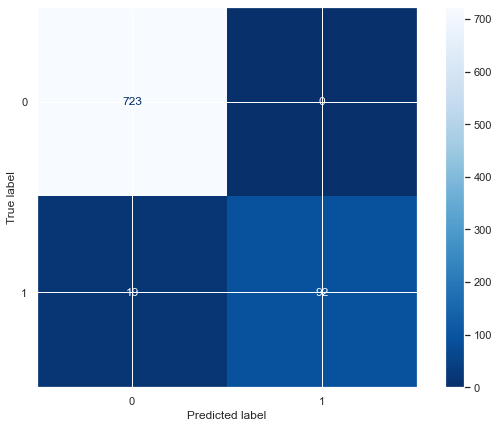

------------------------------------
Testing Accuracy for Our Classifier: 97.72%
------------------------------------
Classification Matrix:
              precision    recall  f1-score   support

           0       0.97      1.00      0.99       723
           1       1.00      0.83      0.91       111

    accuracy                           0.98       834
   macro avg       0.99      0.91      0.95       834
weighted avg       0.98      0.98      0.98       834

Train AUC: 0.9999595573552533
Test AUC: 0.9312922881387612
------------------------------------


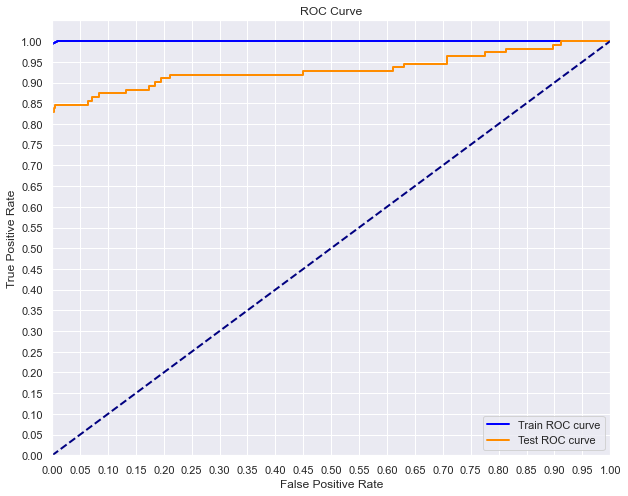

In [165]:
model_control_pp(xgb_clf, X_train_scaled, X_test_scaled, y_train, y_test)

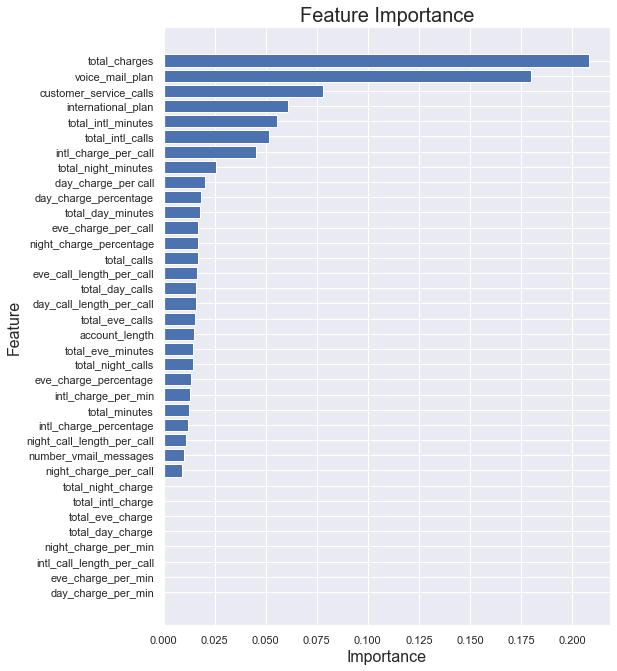

In [166]:
plot_feature_importances(xgb_clf, X)

## EDA

Based on the final model, I did further analysis on total charges, voice mail plan, customer service calls, and international plan, as those were the top 4 features that had influence on the model's predictions.

### International Plan

international_plan  churn
0                   0        0.89
                    1        0.11
1                   0        0.58
                    1        0.42
Name: churn, dtype: float64


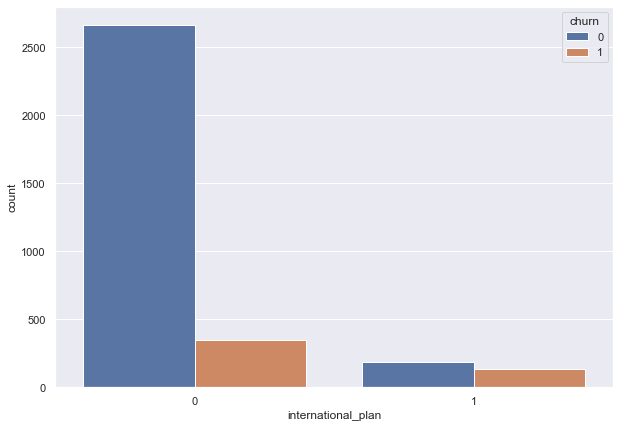

In [167]:
sns.countplot(x='international_plan', hue='churn', data=df);
print(round(df.groupby('international_plan')['churn'].value_counts(normalize=True),2))

In [168]:
df_intl_plan = df[df['international_plan'] == 1]
print('The number of customers with international plan:', len(df_intl_plan))
print(round(df_intl_plan['churn'].value_counts(normalize=True),2))
print('--------------------------------------------------')
df_intl_no_plan = df[df['international_plan'] == 0]
print('The number of customers with no international plan:', len(df_intl_no_plan))
print(round(df_intl_no_plan['churn'].value_counts(normalize=True),2))

The number of customers with international plan: 323
0    0.58
1    0.42
Name: churn, dtype: float64
--------------------------------------------------
The number of customers with no international plan: 3010
0    0.89
1    0.11
Name: churn, dtype: float64


In [169]:
df.groupby('churn')['international_plan'].value_counts()

churn  international_plan
0      0                     2664
       1                      186
1      0                      346
       1                      137
Name: international_plan, dtype: int64

In [170]:
df_intl = df[['international_plan', 'total_intl_minutes', 'total_intl_calls', 
                      'total_intl_charge', 'intl_charge_per_call', 'intl_call_length_per_call', 
                      'intl_charge_per_min', 'intl_charge_percentage', 'total_charges', 'churn']]
df_intl.describe().T

,count,mean,std,min,25%,50%,75%,max
international_plan,3333.0,0.096910,0.295879,0.0,0.000,0.000,0.000,1.000
total_intl_minutes,3333.0,10.237294,2.791840,0.0,8.500,10.300,12.100,20.000
total_intl_calls,3333.0,4.479448,2.461214,0.0,3.000,4.000,6.000,20.000
total_intl_charge,3333.0,2.764581,0.753773,0.0,2.300,2.780,3.270,5.400
intl_charge_per_call,3333.0,0.835893,0.611920,0.0,0.451,0.662,1.025,4.910
intl_call_length_per_call,3333.0,3.095562,2.266218,0.0,1.671,2.450,3.800,18.200
intl_charge_per_min,3333.0,0.268593,0.019798,0.0,0.270,0.270,0.270,0.273
intl_charge_percentage,3333.0,0.047986,0.016007,0.0,0.037,0.047,0.057,0.142
total_charges,3333.0,59.446745,10.507240,23.0,52.000,59.000,66.000,96.000
churn,3333.0,0.144914,0.352067,0.0,0.000,0.000,0.000,1.000


In [171]:
df_intl_plan = df_intl[df_intl['international_plan'] == 1]
print(len(df_intl_plan))
df_intl_no_plan = df_intl[df_intl['international_plan'] == 0]
print(len(df_intl_no_plan))

323
3010


In [172]:
round(df_intl.drop('total_charges', axis=1).groupby(['international_plan', 'churn']).describe().T, 3)

international_plan                      0                 1         
churn                                   0        1        0        1
total_intl_minutes        count  2664.000  346.000  186.000  137.000
                          mean     10.185   10.271    9.778   11.782
                          std       2.820    2.633    2.184    2.901
                          min       0.000    2.000    1.300    4.100
                          25%       8.400    8.700    8.400    9.700
                          50%      10.200   10.300   10.100   11.700
                          75%      12.100   12.000   11.300   13.800
                          max      18.900   18.300   13.000   20.000
total_intl_calls          count  2664.000  346.000  186.000  137.000
                          mean      4.493    4.251    5.102    3.942
                          std       2.450    2.373    2.248    2.952
                          min       0.000    1.000    3.000    1.000
                          25%       3.000    3.000    3.000    2.000
                          50%       4.000    4.000    4.000    3.000
                          75%       6.000    5.000    6.000    5.000
                          max      19.000   15.000   15.000   20.000
total_intl_charge         count  2664.000  346.000  186.000  137.000
                          mean      2.751    2.774    2.641    3.181
                          std       0.761    0.711    0.589    0.783
                          min       0.000    0.540    0.350    1.110
                          25%       2.270    2.350    2.270    2.620
                          50%       2.750    2.780    2.730    3.160
                          75%       3.270    3.240    3.050    3.730
                          max       5.100    4.940    3.510    5.400
intl_charge_per_call      count  2664.000  346.000  186.000  137.000
                          mean      0.829    0.880    0.607    1.172
                          std       0.617    0.599    0.265    0.724
                          min       0.000    0.081    0.058    0.187
                          25%       0.445    0.477    0.392    0.647
                          50%       0.648    0.748    0.586    1.105
                          75%       1.015    1.052    0.790    1.485
                          max       4.910    4.000    1.170    4.100
intl_call_length_per_call count  2664.000  346.000  186.000  137.000
                          mean      3.069    3.259    2.248    4.342
                          std       2.284    2.220    0.983    2.682
                          min       0.000    0.300    0.217    0.695
                          25%       1.650    1.767    1.452    2.400
                          50%       2.400    2.771    2.171    4.100
                          75%       3.750    3.892    2.925    5.500
                          max      18.200   14.800    4.333   15.200
intl_charge_per_min       count  2664.000  346.000  186.000  137.000
                          mean      0.268    0.270    0.270    0.270
                          std       0.022    0.000    0.000    0.000
                          min       0.000    0.269    0.269    0.269
                          25%       0.270    0.270    0.270    0.270
                          50%       0.270    0.270    0.270    0.270
                          75%       0.270    0.270    0.270    0.270
                          max       0.273    0.271    0.271    0.271
intl_charge_percentage    count  2664.000  346.000  186.000  137.000
                          mean      0.048    0.044    0.045    0.053
                          std       0.016    0.016    0.013    0.016
                          min       0.000    0.007    0.005    0.017
                          25%       0.038    0.033    0.038    0.040
                          50%       0.047    0.042    0.046    0.052
                          75%       0.058    0.052    0.053    0.064
                          max       0.142    0.119    0.097    0.10

### Churn vs. International Plan Minutes

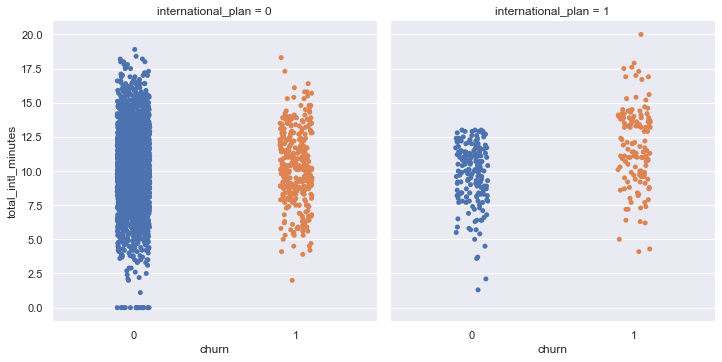

In [173]:
sns.catplot(x='churn', y='total_intl_minutes', col='international_plan', data=df_intl);

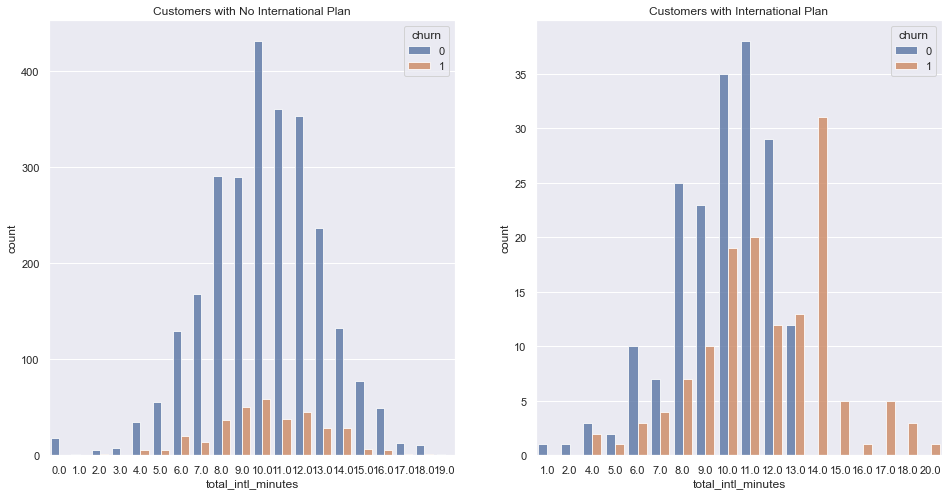

In [174]:
fig, ax = plt.subplots(1,2)
fig.set_size_inches(16,8)
sns.countplot(x=round(df_intl_no_plan['total_intl_minutes']), hue='churn', 
              data=df_intl_no_plan, alpha=0.8, ax=ax[0]).set_title('Customers with No International Plan')
sns.countplot(x=round(df_intl_plan['total_intl_minutes']), hue='churn', data=df_intl_plan, 
              alpha=0.8, ax=ax[1]).set_title('Customers with International Plan')
fig.show();

In [175]:
df_intl[df_intl['total_intl_minutes'] > 13].groupby('international_plan')['churn'].value_counts()

international_plan  churn
0                   0        387
                    1         55
1                   1         57
Name: churn, dtype: int64

In [176]:
print('Average International Minutes with No International Plan:', round(df_intl_no_plan['total_intl_minutes'].mean(),2))
print('Average International Minutes with International Plan:', round(df_intl_plan['total_intl_minutes'].mean(),2))

Average International Minutes with No International Plan: 10.2
Average International Minutes with International Plan: 10.63


### Churn vs International Calls

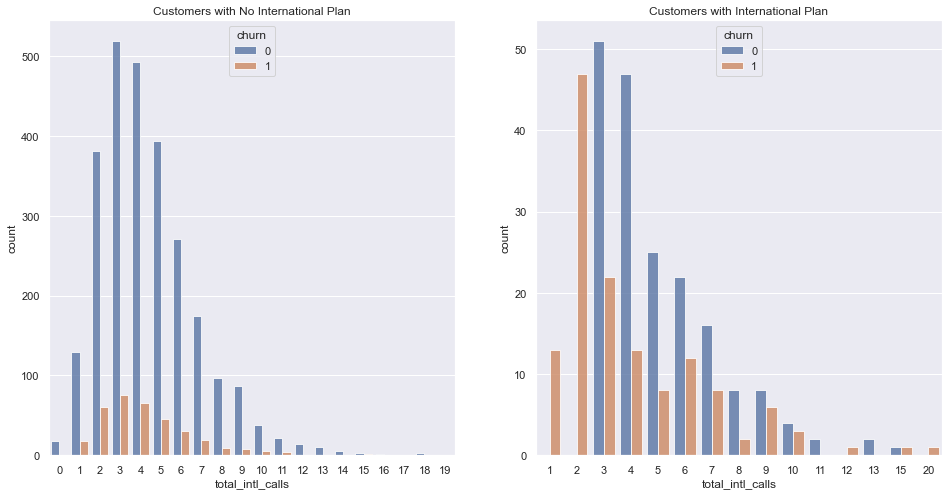

In [177]:
fig, ax = plt.subplots(1,2)
fig.set_size_inches(16,8)
sns.countplot(x='total_intl_calls', hue='churn', data=df_intl_no_plan, 
              alpha=0.8, ax=ax[0]).set_title('Customers with No International Plan')
sns.countplot(x='total_intl_calls', hue='churn', data=df_intl_plan, 
              alpha=0.8, ax=ax[1]).set_title('Customers with International Plan')
fig.show();

In [178]:
print('Average International Calls with No International Plan:', round(df_intl_no_plan['total_intl_calls'].mean(),2))
print('Average International Calls with International Plan:', round(df_intl_plan['total_intl_calls'].mean(),2))

Average International Calls with No International Plan: 4.47
Average International Calls with International Plan: 4.61


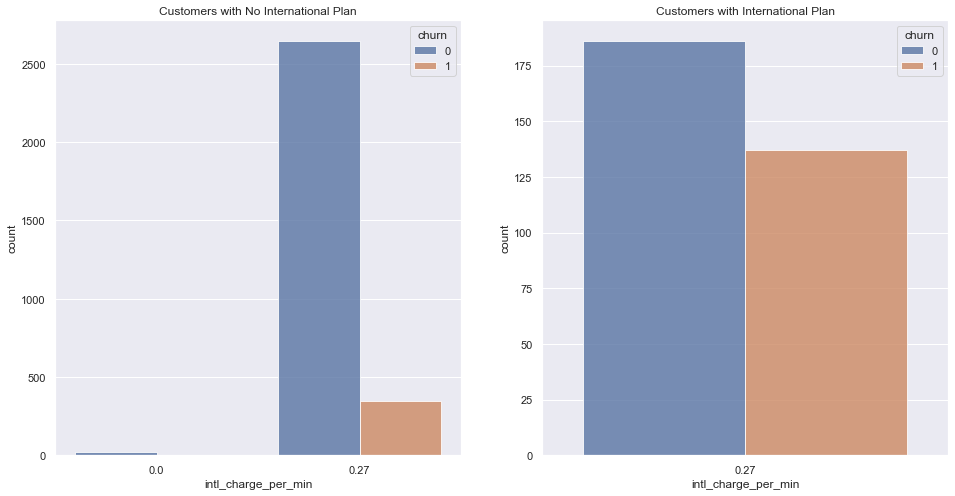

In [179]:
fig, ax = plt.subplots(1,2)
fig.set_size_inches(16,8)
sns.countplot(x=round(df_intl_no_plan['intl_charge_per_min'],2), hue='churn', data=df_intl_no_plan, 
              alpha=0.8, ax=ax[0]).set_title('Customers with No International Plan')
sns.countplot(x=round(df_intl_plan['intl_charge_per_min'],2), hue='churn', data=df_intl_plan,  
              alpha=0.8, ax=ax[1]).set_title('Customers with International Plan')
fig.show();

### Churn vs International Call Length 

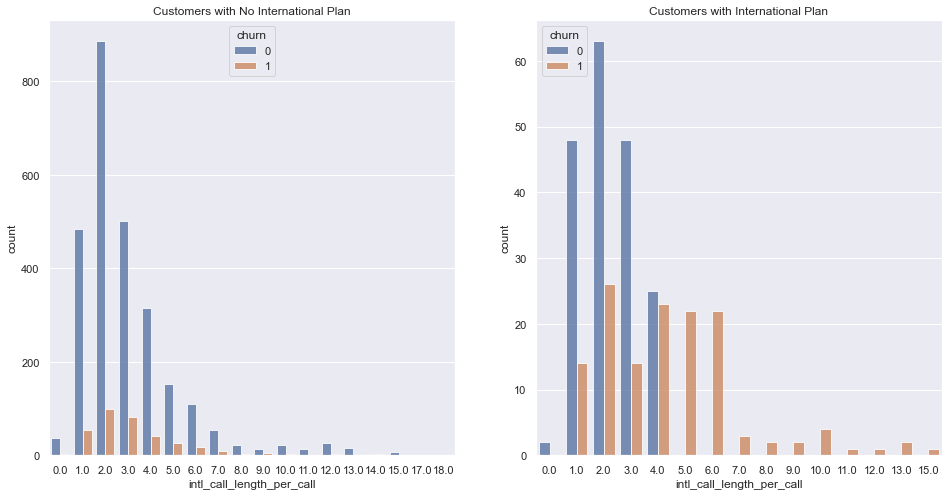

In [180]:
fig, ax = plt.subplots(1,2)
fig.set_size_inches(16,8)
sns.countplot(x=round(df_intl_no_plan['intl_call_length_per_call']), hue='churn', data=df_intl_no_plan, 
              alpha=0.8, ax=ax[0]).set_title('Customers with No International Plan')
sns.countplot(x=round(df_intl_plan['intl_call_length_per_call']), hue='churn', data=df_intl_plan, 
              alpha=0.8, ax=ax[1]).set_title('Customers with International Plan')
fig.show();

In [181]:
print('Average call length per call with no international plan:',round(df_intl_no_plan['intl_call_length_per_call'].mean(),3))
print('Average call length per call with international plan:',round(df_intl_plan['intl_call_length_per_call'].mean(),3))

Average call length per call with no international plan: 3.091
Average call length per call with international plan: 3.136


### Churn vs. International Charge Per Call

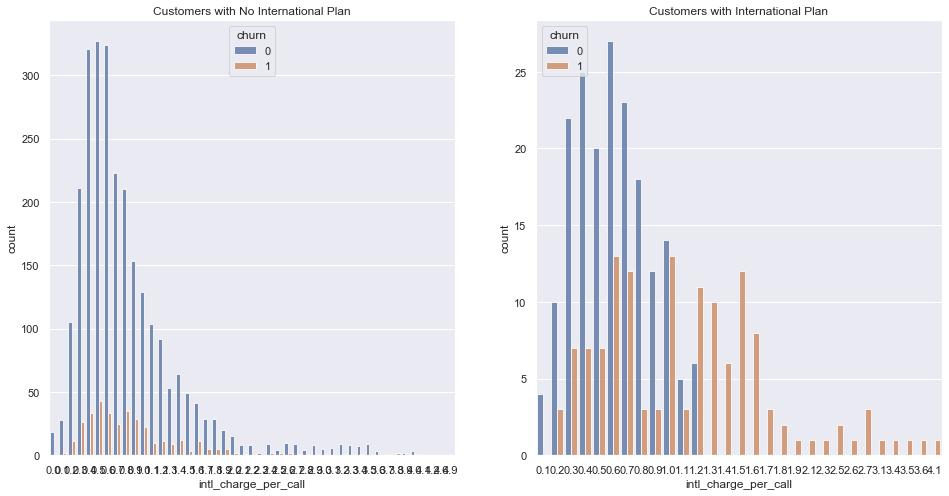

In [182]:
fig, ax = plt.subplots(1,2)
fig.set_size_inches(16,8)
sns.countplot(x=round(df_intl_no_plan['intl_charge_per_call'],1), hue='churn', data=df_intl_no_plan,
              alpha=0.8, ax=ax[0]).set_title('Customers with No International Plan')
sns.countplot(x=round(df_intl_plan['intl_charge_per_call'],1), hue='churn', data=df_intl_plan, 
              alpha=0.8, ax=ax[1]).set_title('Customers with International Plan')
fig.show();

In [183]:
print('Average international charge per call without international plan',round(df_intl_no_plan['intl_charge_per_call'].mean(),2))
print('Average international charge per call with international plan', round(df_intl_plan['intl_charge_per_call'].mean(),2))

Average international charge per call without international plan 0.83
Average international charge per call with international plan 0.85


### Total International Charge vs International Charge Percentage

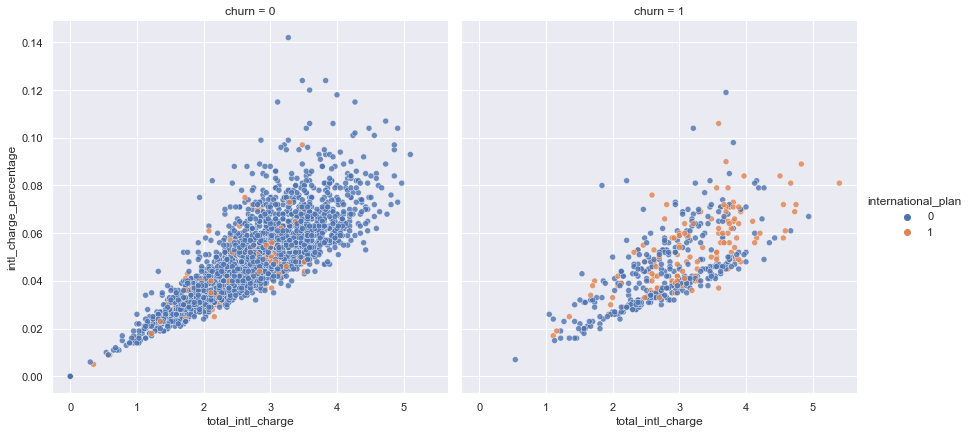

In [184]:
sns.relplot(x='total_intl_charge', y='intl_charge_percentage', hue='international_plan', 
            col='churn', data=df_intl, alpha=0.8, height=6);

### Voice Mail Plan

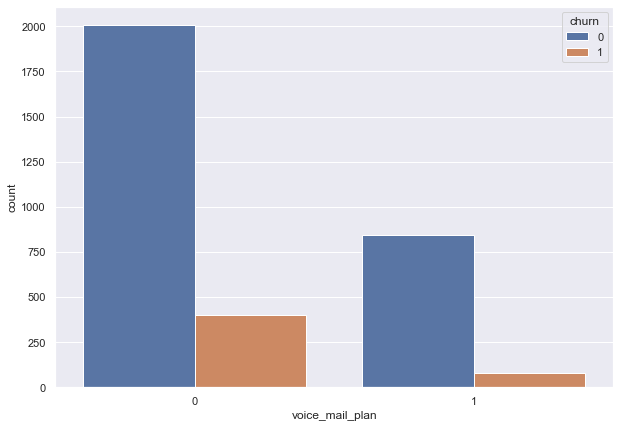

In [185]:
sns.countplot(x='voice_mail_plan', hue='churn', data=df);

In [186]:
print(df.groupby('churn')['voice_mail_plan'].value_counts())
round(df.groupby('churn')['voice_mail_plan'].value_counts(normalize=True),2)

churn  voice_mail_plan
0      0                  2008
       1                   842
1      0                   403
       1                    80
Name: voice_mail_plan, dtype: int64


churn  voice_mail_plan
0      0                  0.70
       1                  0.30
1      0                  0.83
       1                  0.17
Name: voice_mail_plan, dtype: float64

In [187]:
print('Average Voicemail Messages for Customers With Voicemail Plan:', 
      round(df[df['voice_mail_plan'] == 1]['number_vmail_messages'].mean(),2))
print('Average Voicemail Messages for Customers With Voicemail Plan Who Churn:', 
      round(df[(df['voice_mail_plan'] == 1) & (df['churn'] == 1)]['number_vmail_messages'].mean(),2))
print('Average Voicemail Messages for Customers With Voicemail Plan Who Not Churn:', 
      round(df[(df['voice_mail_plan'] == 1) & (df['churn'] == 0)]['number_vmail_messages'].mean(),2))

Average Voicemail Messages for Customers With Voicemail Plan: 29.28
Average Voicemail Messages for Customers With Voicemail Plan Who Churn: 30.89
Average Voicemail Messages for Customers With Voicemail Plan Who Not Churn: 29.12


### Total Charges vs. Churn

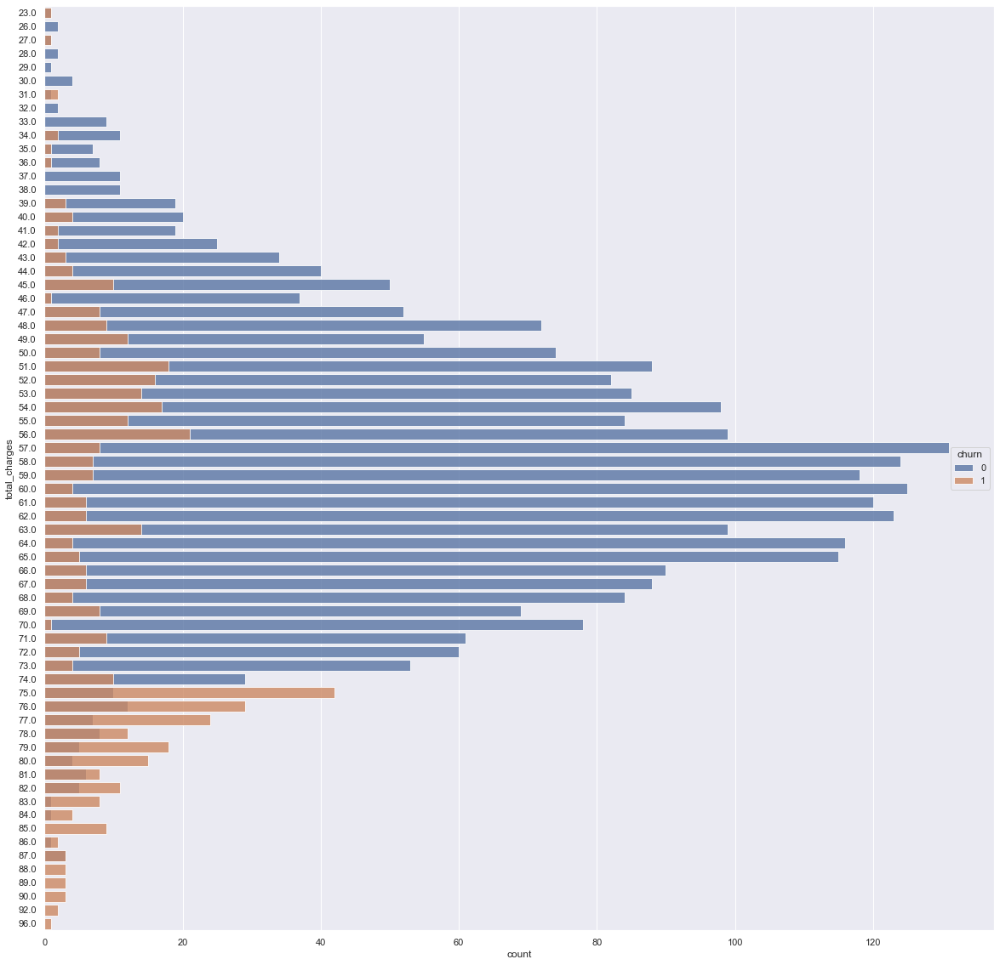

In [188]:
plt.figure(figsize=(20,20))
sns.countplot(y='total_charges', hue='churn', data=df, dodge=False, alpha=0.8)
plt.show();

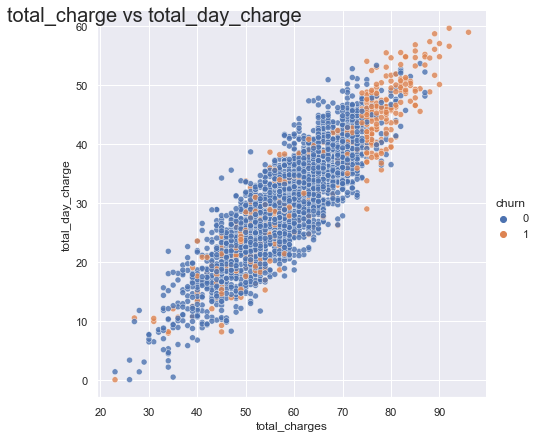

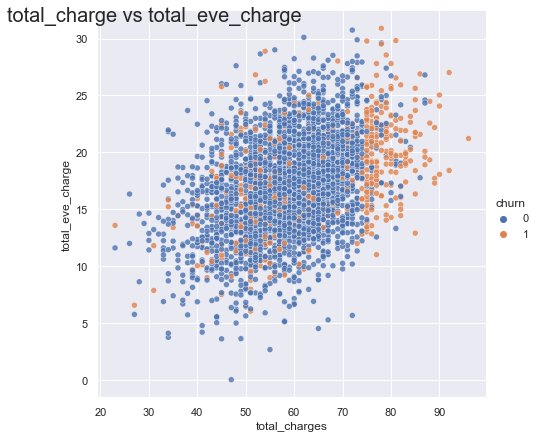

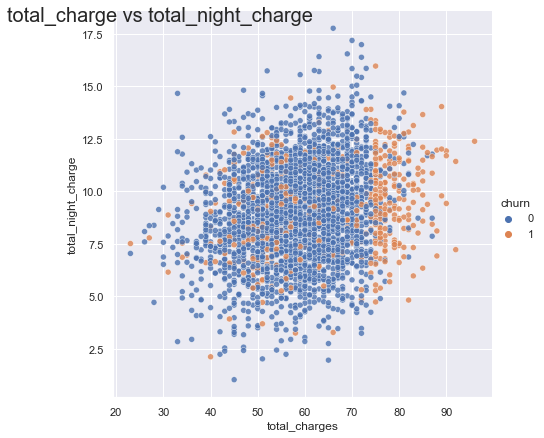

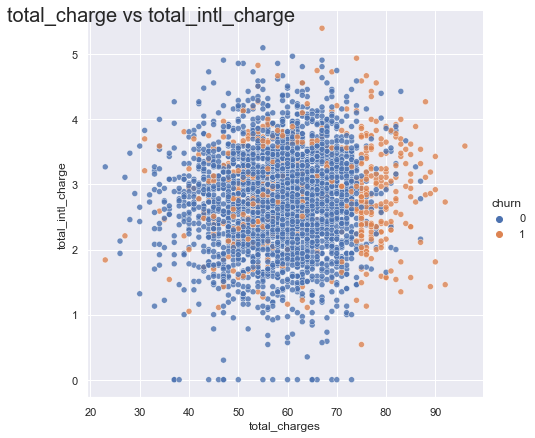

In [189]:
cols = ['total_day_charge', 'total_eve_charge', 'total_night_charge', 'total_intl_charge' ]

for col in cols:
    g = sns.relplot(x='total_charges', y=col, hue='churn', data=df, alpha=0.8, height=6)                   
    g.fig.suptitle('total_charge vs {}'.format(col), x=0.2, y=0.98, fontsize=20)

In [190]:
round(df.groupby('churn')['total_charges', 'total_day_charge', 'total_eve_charge', 
                'total_night_charge', 'total_intl_charge'].describe().T,2)

churn                           0       1
total_charges      count  2850.00  483.00
                   mean     58.45   65.35
                   std       9.47   13.88
                   min      23.00   23.00
                   25%      52.00   53.00
                   50%      59.00   67.00
                   75%      65.00   77.00
                   max      87.00   96.00
total_day_charge   count  2850.00  483.00
                   mean     29.78   35.18
                   std       8.53   11.73
                   min       0.00    0.00
                   25%      24.28   26.06
                   50%      30.12   36.99
                   75%      35.75   45.21
                   max      53.65   59.64
total_eve_charge   count  2850.00  483.00
                   mean     16.92   18.05
                   std       4.27    4.40
                   min       0.00    6.03
                   25%      13.98   15.06
                   50%      16.97   17.96
                   75%      19.82   21.20
                   max      30.75   30.91
total_night_charge count  2850.00  483.00
                   mean      9.01    9.24
                   std       2.30    2.12
                   min       1.04    2.13
                   25%       7.47    7.70
                   50%       9.01    9.22
                   75%      10.57   10.80
                   max      17.77   15.97
total_intl_charge  count  2850.00  483.00
                   mean      2.74    2.89
                   std       0.75    0.75
                   min       0.00    0.54
                   25%       2.27    2.38
                   50%       2.75    2.86
                   75%       3.24    3.46
                   max       5.10    5.40

### Customer Service Calls vs Churn

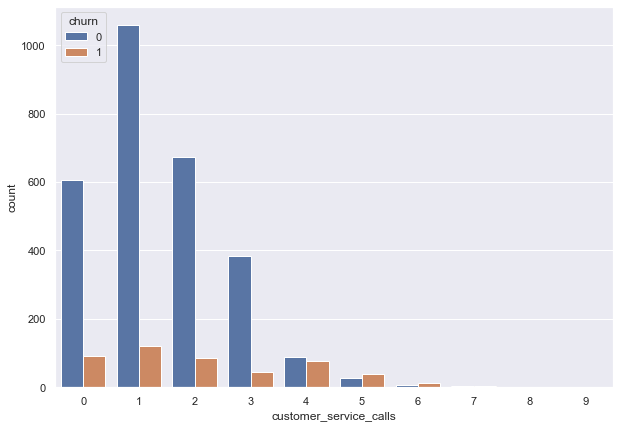

In [191]:
sns.countplot(x='customer_service_calls', hue='churn', data=df);

In [192]:
df.groupby('customer_service_calls')['churn'].value_counts()

customer_service_calls  churn
0                       0         605
                        1          92
1                       0        1059
                        1         122
2                       0         672
                        1          87
3                       0         385
                        1          44
4                       0          90
                        1          76
5                       1          40
                        0          26
6                       1          14
                        0           8
7                       1           5
                        0           4
8                       0           1
                        1           1
9                       1           2
Name: churn, dtype: int64

In [193]:
print('The number of customers who made 3 or less customer service calls:', 
      len(df[df['customer_service_calls'] <= 3]))
print(round(df[df['customer_service_calls'] <= 3]['churn'].value_counts(normalize=True),2))
print(df[df['customer_service_calls'] <= 3]['churn'].value_counts())

print('----------------------------------------------------------------------')
print('The number of customers who made more than 3 customer service calls:', 
      len(df[df['customer_service_calls'] > 3]))
print(round(df[df['customer_service_calls'] > 3]['churn'].value_counts(normalize=True),2))
print(df[df['customer_service_calls'] > 3]['churn'].value_counts())

The number of customers who made 3 or less customer service calls: 3066
0    0.89
1    0.11
Name: churn, dtype: float64
0    2721
1     345
Name: churn, dtype: int64
----------------------------------------------------------------------
The number of customers who made more than 3 customer service calls: 267
1    0.52
0    0.48
Name: churn, dtype: float64
1    138
0    129
Name: churn, dtype: int64


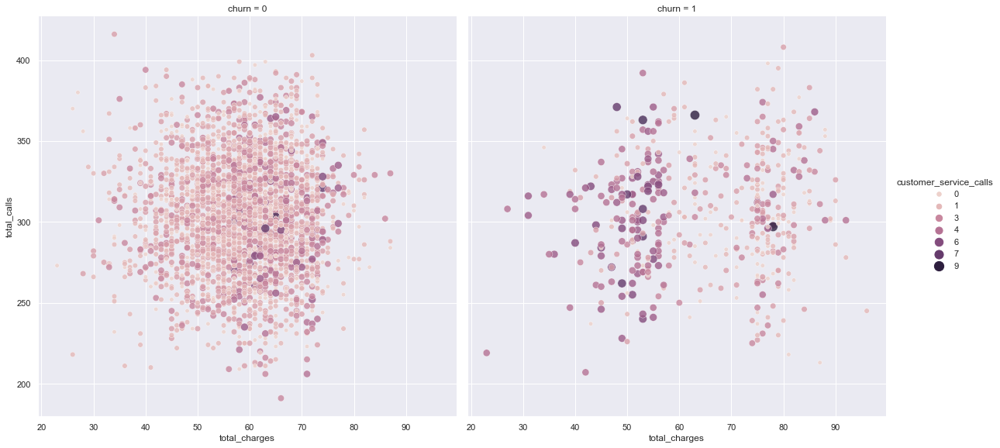

In [194]:
sns.relplot(x='total_charges', y='total_calls', hue='customer_service_calls', col='churn', data=df,                 
            alpha=0.8, height=8, size='customer_service_calls', sizes=(30,150));

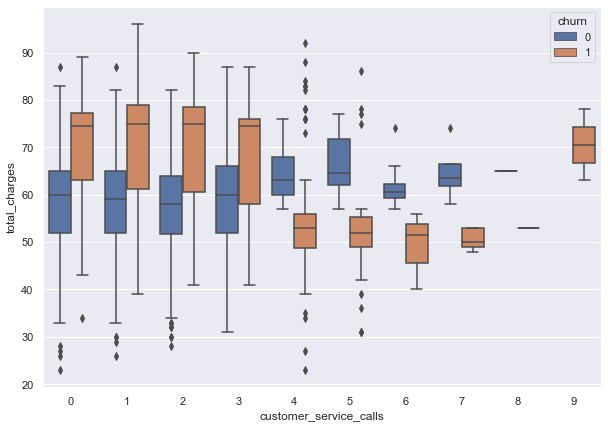

In [195]:
df_cp = df.copy()
df_cp['customer_service_calls'] = df_cp['customer_service_calls'].astype('object')
sns.boxplot(x='customer_service_calls', y='total_charges', data=df_cp, hue='churn');

In [196]:
for i in range(0,len(df_cp)):
    if df['customer_service_calls'][i] <= 3:
        df_cp['customer_service_calls'][i] = '(0,1,2,3)_calls'
        
    elif df['customer_service_calls'][i] <= 7:
        df_cp['customer_service_calls'][i] = '(4,5,6,7)_calls'

    elif df['customer_service_calls'][i] <= 9:
        df_cp['customer_service_calls'][i] = '(8,9)_calls'

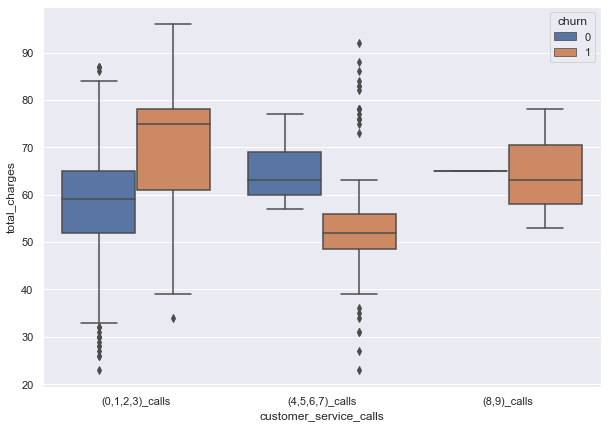

In [197]:
sns.boxplot(x='customer_service_calls', y='total_charges', 
            data=df_cp, hue='churn');

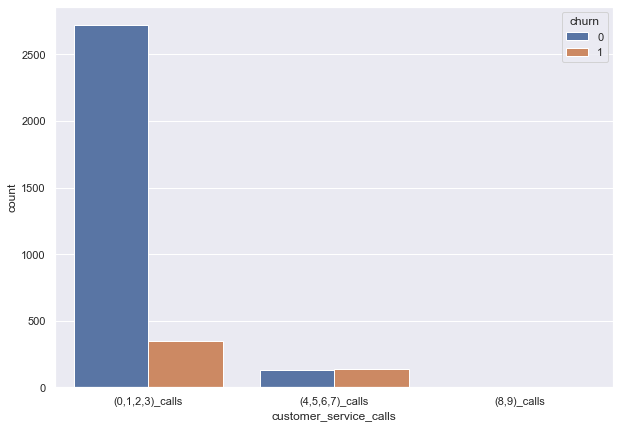

In [198]:
sns.countplot(x='customer_service_calls', hue='churn', data=df_cp);

## Recommendations

* Evaluate the rates we’re charging our customers.
    - Customers seem to be displeased with the high rates, as those who are charged the most tend to be more likely to churn.
* Give more advertisement to our voicemail plan.
    - With the low number of people that are subscribed to our voicemail plan, it seems that some customers might simply be unaware that we offer one.
* Evaluate customer service and what we might be able to do better to assist the customer.
    - Customers making more than 3 service calls are churning at over 50%. 
    - Additional training for customer service staff might be needed, but it also could be related to other factors.
* Research whether an international plan is worth providing, and if it is, look at ways that the service might be improved.
    - Very few customers are using an international plan
    - Those that are using it are seeing no cost reduction to their service.
